# Thickness mapping the vasculature

We want to analyze the vasculature and thus need a thickness map.
Let's see what we can provide.

In [1]:
import platform
import os
import pandas
import glob
from tqdm.auto import tqdm
import dask
from dask.distributed import Client, LocalCluster
import dask_image.imread
import imageio
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import seaborn
import skimage

In [2]:
# Import our own parsing functions which we've added as submodule
from BrukerSkyScanLogfileRuminator.parsing_functions import *

In [3]:
# Set dask temporary folder
# Do this before creating a client: https://stackoverflow.com/a/62804525/323100
import tempfile
if 'Linux' in platform.system():
    tmp = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
elif 'Darwin' in platform.system():
    tmp = tempfile.gettempdir()
else:
    if 'anaklin' in platform.node():
        tmp = os.path.join('F:\\')
    else:
        tmp = os.path.join('D:\\')
dask.config.set({'temporary_directory': os.path.join(tmp, 'tmp')})
print('Dask temporary files go to %s' % dask.config.get('temporary_directory'))

Dask temporary files go to /media/habi/Fast_SSD/tmp


In [4]:
from dask.distributed import Client
cluster = LocalCluster()
client = Client(cluster)

/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39213 instead
  warnings.warn(


In [5]:
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:39213/status,
Dashboard: http://127.0.0.1:39213/status,Workers: 8
Total threads: 32,Total memory: 125.79 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39243,Workers: 8
Dashboard: http://127.0.0.1:39213/status,Total threads: 32
Started: Just now,Total memory: 125.79 GiB
Comm: tcp://127.0.0.1:36063,Total threads: 4
Dashboard: http://127.0.0.1:40509/status,Memory: 15.72 GiB
Nanny: tcp://127.0.0.1:43217,


In [6]:
print('You can seee what DASK is doing at "http://localhost:%s/status"' % client.scheduler_info()['services']['dashboard'])

You can seee what DASK is doing at "http://localhost:39213/status"


In [7]:
# Set up figure defaults
plt.rc('image', cmap='gray', interpolation='nearest')  # Display all images in b&w and with 'nearest' interpolation
plt.rcParams['figure.figsize'] = (16, 9)  # Size up figures a bit
plt.rcParams['figure.dpi'] = 300

In [8]:
# Setup scale bar defaults
plt.rcParams['scalebar.location'] = 'lower right'
plt.rcParams['scalebar.frameon'] = False
plt.rcParams['scalebar.color'] = 'white'

In [9]:
# Different locations if running either on Linux or Windows
FastSSD = True
# to speed things up significantly
if 'Linux' in platform.system():
    if FastSSD:
        BasePath = os.path.join(os.sep, 'media', 'habi', 'Fast_SSD')
    else:
        BasePath = os.path.join(os.sep, 'home', 'habi', 'research-storage-djonov')
elif 'Darwin' in platform.system():
    # First mount smb://resstore.unibe.ch/ana_rs_djonov/data in the Finder
    FastSSD = False
    BasePath = os.path.join('/Volumes/data/')
elif 'Windows' in platform.system():
    if FastSSD:
        BasePath = os.path.join('F:\\')
    else:
        if 'anaklin' in platform.node():
            BasePath = os.path.join('V:\\')
        else:
            BasePath = os.path.join('V:\\')
Root = os.path.join(BasePath, 'VETSUISSE', 'Laminitis')
print('We are loading all the data from %s' % Root)

We are loading all the data from /media/habi/Fast_SSD/VETSUISSE/Laminitis


In [10]:
# Make us a dataframe for saving all that we need
Data = pandas.DataFrame()

In [11]:
# Get *all* log files, unsorted but faster than with glob
print('Searching for all log files in %s' % Root)
Data['LogFile'] = [os.path.join(root, name)
                   for root, dirs, files in os.walk(Root)
                   for name in files
                   if name.endswith((".log"))]

Searching for all log files in /media/habi/Fast_SSD/VETSUISSE/Laminitis


In [12]:
# Get all folders
Data['Folder'] = [os.path.dirname(f) for f in Data['LogFile']]

In [13]:
# Get rid of all logfiles that we don't want
for c, row in Data.iterrows():
    if 'rec' not in row.Folder:  # drop all non-rec folders
        Data.drop([c], inplace=True)
    elif 'SubScan' in row.Folder:  # drop all partial reconstructions which might be there from synchronization
        Data.drop([c], inplace=True)        
    elif 'rectmp.log' in row.LogFile:  # drop all temporary logfiles
        Data.drop([c], inplace=True)
# Reset dataframe to something that we would get if we only would have loaded the 'rec' files
Data = Data.reset_index(drop=True)

In [14]:
for l in Data.LogFile:
    print(l[len(Root):])

/Limb03/rec/Limb03_rec.log
/Limb03/rec02/Limb03_rec.log
/Limb05/rec03/Limb05_rec.log
/Limb04/rec/Limb04_rec.log
/Limb01/rec/Limb01_rec.log
/Limb02/rec_02_42mm_41.0um_AlCu/Limb02_rec.log
/Limb02/rec_01_00mm_41.0um_AlCu/Limb02_rec.log


In [15]:
# Generate us some meaningful colums
Data['Sample'] = [l[len(Root)+1:].split(os.sep)[-3] for l in Data['LogFile']]
Data['Scan'] = ['_'.join(l[len(Root)+1:].split(os.sep)[1:-1]) for l in Data['LogFile']]

In [16]:
# Look for needed data
Data['Voxelsize'] = [pixelsize(log, rounded=True) for log in Data['LogFile']]

In [17]:
Data

,LogFile,Folder,Sample,Scan,Voxelsize
0,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb03,rec,42.0
1,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb03,rec02,40.0
2,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb05,rec03,45.0
3,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb04,rec,44.0
4,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb01,rec,85.0
5,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb02,rec_02_42mm_41.0um_AlCu,41.0
6,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb02,rec_01_00mm_41.0um_AlCu,41.0


In [18]:
# Load all reconstructions into ephemereal DASK arrays
Reconstructions = [dask_image.imread.imread(os.path.join(f, '*rec*.png')) for f in Data.Folder]
# Drop last axis, since dask insists on reading the images as RGB, even if they aren't
Reconstructions = [r[:,:,:,0].squeeze() for r in Reconstructions]

In [19]:
Reconstructions[0].rechunk(chunks='auto')

dask.array<rechunk-merge, shape=(1550, 2052, 2724), dtype=uint8, chunksize=(24, 2052, 2724), chunktype=numpy.ndarray>

In [20]:
import zarr

In [21]:
from numcodecs import Blosc

In [22]:
# Convert the reconstruction PNGs on disk to .zarr for much faster access
Data['OutputNameZarr'] = [f + '.zarr' for f in Data.Folder]
for c, row in tqdm(Data.iterrows(),
                   desc='Converting reconstructions to .zarr',
                   total=len(Data)):
    if not os.path.exists(row['OutputNameZarr']):
        Reconstructions[c].rechunk(chunks='auto').to_zarr(row['OutputNameZarr'],
                                                          overwrite=True)

Converting reconstructions to .zarr:   0%|          | 0/7 [00:00<?, ?it/s]

In [23]:
# Drop some samples, for the moment we want to work only on one sample...
for c, row in Data.iterrows():
    if 'Limb05' not in row.Sample:  # use only this one
        Data.drop([c], inplace=True)
# Reset dataframe to something that we would get if we only would have loaded the 'rec' files
Data = Data.reset_index(drop=True)

In [24]:
Data

,LogFile,Folder,Sample,Scan,Voxelsize,OutputNameZarr
0,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...,Limb05,rec03,45.0,/media/habi/Fast_SSD/VETSUISSE/Laminitis/Limb0...


In [25]:
# Load the correct reconstructions/zarr arrays
Reconstructions = [dask.array.from_zarr(file) for file in Data['OutputNameZarr']]

/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


In [26]:
# The three cardinal directions
directions = ['Axial',
              'Coronal',
              'Sagittal']

In [27]:
Reconstructions[0]

dask.array<from-zarr, shape=(3345, 3072, 3072), dtype=uint8, chunksize=(14, 3072, 3072), chunktype=numpy.ndarray>

In [28]:
# Read or calculate the directional MIPs, put them into the dataframe and save them to disk
for d, direction in enumerate(directions):
    Data['MIP_' + direction] = [None] * len(Reconstructions)
for c, row in tqdm(Data.iterrows(), desc='MIPs', total=len(Data), leave=False):
    for d, direction in tqdm(enumerate(directions),
                             desc='%s/%s' % (row['Sample'], row['Scan']),
                             leave=False,
                             total=len(directions)):
        outfilepath = os.path.join(os.path.dirname(row['Folder']),
                                   '%s.%s.MIP.%s.png' % (row['Sample'],
                                                      row['Scan'],
                                                      direction))
        if not os.path.exists(outfilepath):
            # Generate MIP
            # drop last axis, since dask.imread insists on reading reconstructions PNGs as RGB
            mip = Reconstructions[c].max(axis=d).compute()
            # Save it out
            imageio.imwrite(outfilepath, mip.astype('uint8'))
        Data.at[c, 'MIP_' + direction] = dask_image.imread.imread(outfilepath).squeeze()

MIPs:   0%|          | 0/1 [00:00<?, ?it/s]

Limb05/rec03:   0%|          | 0/3 [00:00<?, ?it/s]

Showing MIP overview:   0%|          | 0/1 [00:00<?, ?it/s]

Limb05/rec03:   0%|          | 0/3 [00:00<?, ?it/s]

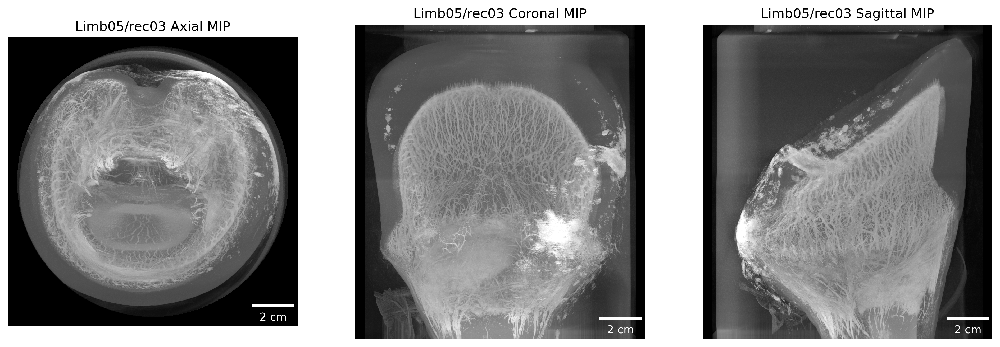

In [29]:
# Show MIP slices
for c, row in tqdm(Data.iterrows(),
                   desc='Showing MIP overview',
                   total=len(Data),
                   leave=False):
    for d, direction in tqdm(enumerate(directions),
                             desc='%s/%s' % (row['Sample'], row['Scan']),
                             leave=False,
                             total=len(directions)):
        plt.subplot(1, 3, d + 1)
        plt.imshow(row['MIP_' + direction].squeeze())
        plt.gca().add_artist(ScaleBar(row['Voxelsize'],
                                      'um'))
        plt.title('%s %s' % (os.path.join(row['Sample'], row['Scan']),
                             direction + ' MIP'))
        plt.axis('off')
    plt.show()

In [30]:
Reconstructions[0]

dask.array<from-zarr, shape=(3345, 3072, 3072), dtype=uint8, chunksize=(14, 3072, 3072), chunktype=numpy.ndarray>

In [31]:
import napari

In [32]:
viewer = napari.Viewer(ndisplay=3)

In [33]:
# Downsample the some calculations, to wait less
downsample = 5

In [34]:
Reconstructions[0][::downsample,::downsample,::downsample]

dask.array<getitem, shape=(669, 615, 615), dtype=uint8, chunksize=(3, 615, 615), chunktype=numpy.ndarray>

In [35]:
_ = viewer.add_image(Reconstructions[0][::downsample,::downsample,::downsample])

In [36]:
# Calculate histogram of *all* reconstructions
Data['Histogram'] = [dask.array.histogram(dask.array.array(rec[::downsample,::downsample,::downsample]),
                                          bins=2**8,
                                          range=[0, 2**8]) for rec in Reconstructions]
Data['Histogram'] = [h.compute() for h,b in Data['Histogram']]

In [37]:
# Calculate treshold(s)
# Exclude gray values lower than the average gray value of the sample
Data['Thresholds'] = [skimage.filters.threshold_multiotsu(r[::downsample, ::downsample, ::downsample][r[::downsample, ::downsample, ::downsample] >
                                                          Reconstructions[0][::downsample,::downsample,::downsample].mean().compute()].compute(), classes=5) for r in Reconstructions]

In [38]:
Data[['Sample', 'Scan', 'Thresholds']]

,Sample,Scan,Thresholds
0,Limb05,rec03,"[48, 68, 85, 113]"


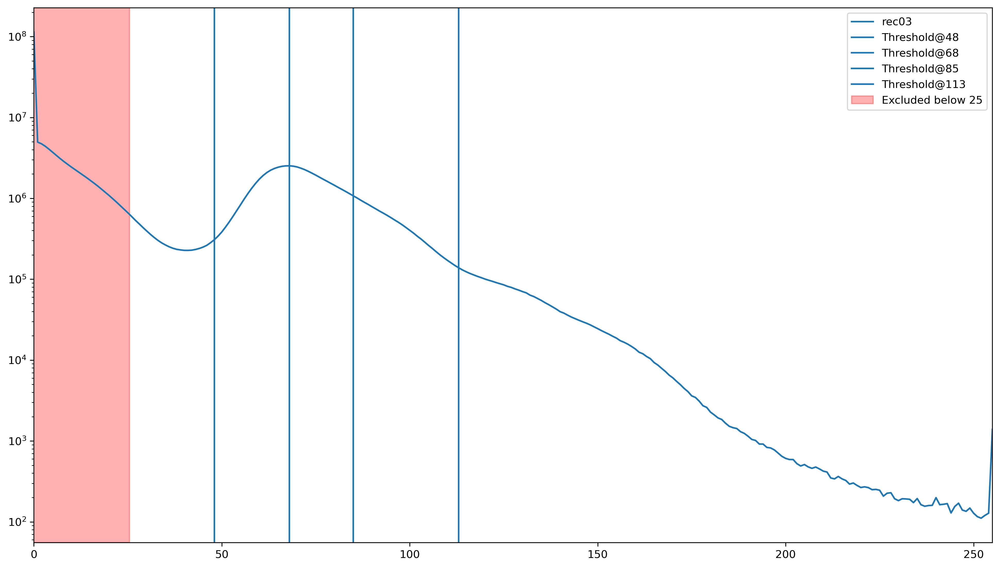

In [39]:
for c, row in Data.iterrows():
    plt.semilogy(row.Histogram,
                 label=row.Scan,
                 c=seaborn.color_palette()[c])
    for t in row.Thresholds:
        plt.axvline(t,
                    label='Threshold@%s' % t,
                    c=seaborn.color_palette()[c])
    exclusionvalue = Reconstructions[0][::downsample,::downsample,::downsample].mean().compute()        
    plt.axvspan(0, exclusionvalue, label='Excluded below %0.f' % exclusionvalue, color='red', alpha=0.309)
    plt.xlim([0,255])
    plt.legend()
    plt.show()

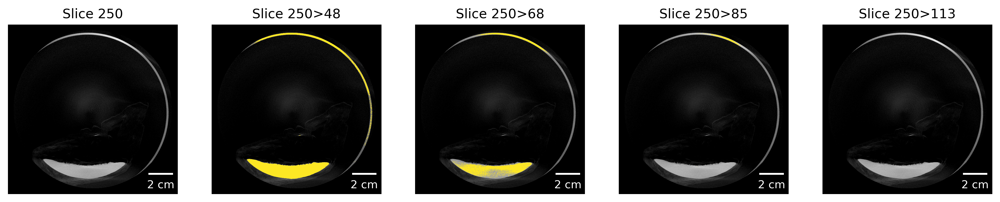

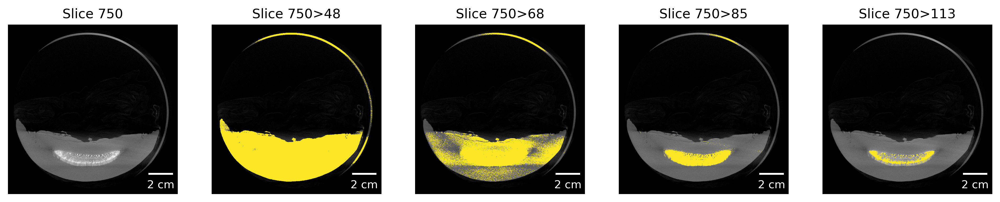

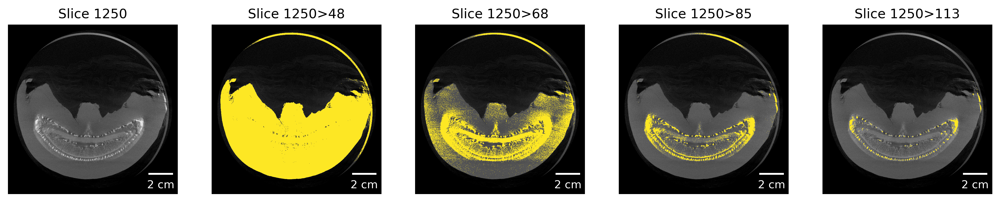

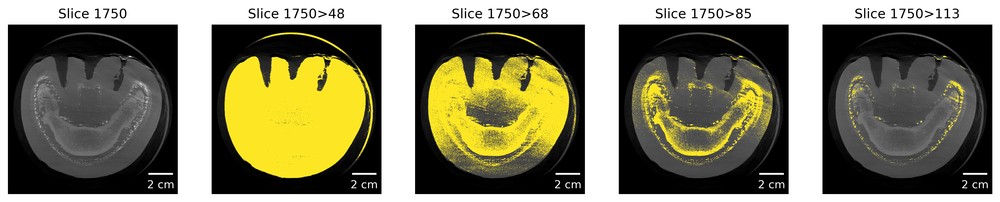

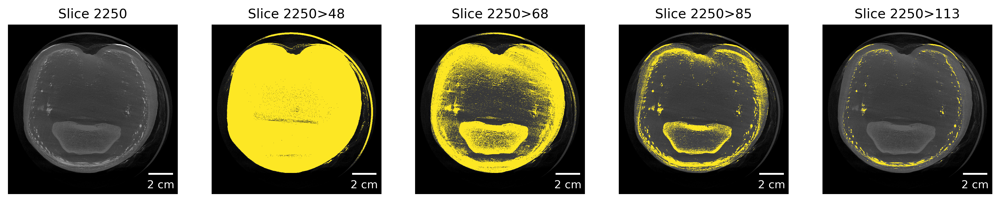

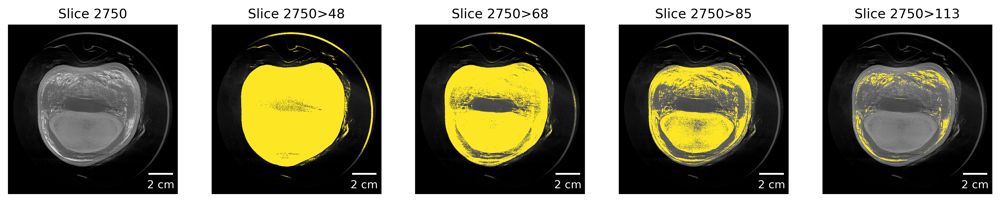

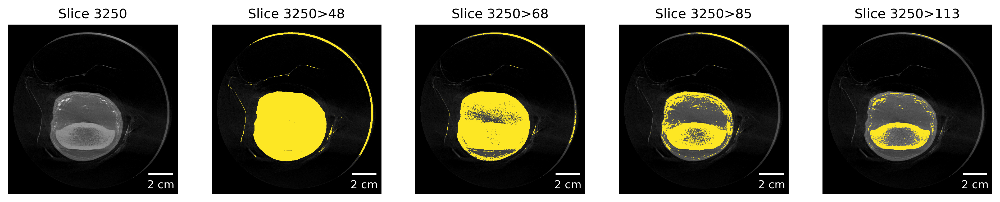

In [40]:
# Show threshold applied to some reconstructions
for recnum in range(250,Reconstructions[0].shape[0],500):
    image = Reconstructions[0][recnum].compute()
    plt.subplot(1,len(Data.Thresholds[0])+1,1)
    plt.imshow(image)
    plt.gca().add_artist(ScaleBar(Data['Voxelsize'][0],'um'))    
    plt.title('Slice %s' % recnum)
    plt.axis('off')
    for c, threshold in enumerate(Data.Thresholds[0]):
        plt.subplot(1,len(Data.Thresholds[0])+1,c+2)
        plt.imshow(image)
        plt.imshow(dask.array.ma.masked_equal(image > threshold, False), cmap='viridis_r')
        plt.gca().add_artist(ScaleBar(Data['Voxelsize'][0],'um'))            
        plt.title('Slice %s>%s' % (recnum, threshold))
        plt.axis('off')        
    plt.show()

In [41]:
from matplotlib.patches import Rectangle
def cutout(whichsample,
           center,
           sidelength=256,
           verbose=False):
    '''
    Cut out a small region of the dataset.
    Based on `cropper` function we've written for the heart neoangiogenesis project.
    '''
    # Generate output name to see if we already did it.
    # And then *not* do it if we already did it ;)
    OutputNameCrop = Data['Folder'][whichsample] + '.cutout_at.%04d.%04d.%04d.with_sidelength.%04d.px.zarr' % (center[0],
                                                                                                               center[1],
                                                                                                               center[2],
                                                                                                               sidelength)
    if os.path.exists(OutputNameCrop):
        print('Already saved cutout to %s' % OutputNameCrop[len(Root)+1:])
    else:
        if len(center) != 3:
            print('We need three coordinates for the center, try again!')        
        if verbose:
            print('Extracting ROI with a size of %sx%sx%s px '
                  'from %s-dimensional image of %s with a size of %sx%sx%s px' % (sidelength, sidelength, sidelength,
                                                                                  len(Reconstructions[whichsample].shape),
                                                                                  Data['Sample'][whichsample],
                                                                                  Reconstructions[whichsample].shape[0],
                                                                                  Reconstructions[whichsample].shape[1],
                                                                                  Reconstructions[whichsample].shape[2]))
            print('Centering cutout around')
            print('\t-x: %s' % str(center[0]).rjust(4))
            print('\t-y: %s' % str(center[1]).rjust(4))
            print('\t-z: %s' % str(center[2]).rjust(4))
            print('Saving cutout to %s' % OutputNameCrop[len(Root)+1:])
        # Calculate crop
        Crop = Reconstructions[whichsample][center[2] - (sidelength // 2):center[2] + ((1+sidelength) // 2),
                                            center[1] - (sidelength // 2):center[1] + ((1+sidelength) // 2),
                                            center[0] - (sidelength // 2):center[0] + ((1+sidelength) // 2)]
        # Save to disk
        Crop.rechunk(chunks='auto').to_zarr(OutputNameCrop)
    if verbose:
        for d, direction in enumerate(directions):
            plt.subplot(2, 3, d+1)
            plt.imshow(Data['MIP_' + direction][whichsample])
            plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um',
                                          color=seaborn.color_palette()[d]))
            plt.title('%s %s: %s' % (Data['Sample'][whichsample],
                                     direction + ' MIP',
                                     Data['MIP_' + direction][whichsample].shape))
            if d==0:
                plt.axvline(center[0], alpha=0.618, label='c%s:%s' % (0, center[0]), color=seaborn.color_palette()[2])
                plt.axhline(center[1], alpha=0.618, label='c%s:%s' % (1, center[1]), color=seaborn.color_palette()[1])
                plt.gca().add_patch(Rectangle((center[0] - (sidelength // 2), center[1] - (sidelength // 2)),
                                              sidelength, sidelength,
                                              edgecolor='white',
                                              alpha=0.618,
                                              facecolor='none'))                                            
            elif d==1:
                plt.axvline(center[0], alpha=0.618, label='c%s:%s' % (0, center[0]), color=seaborn.color_palette()[2])
                plt.axhline(center[2], alpha=0.618, label='c%s:%s' % (2, center[2]), color=seaborn.color_palette()[0])
                plt.gca().add_patch(Rectangle((center[0] - (sidelength // 2), center[2] - (sidelength // 2)),
                                              sidelength, sidelength,
                                              edgecolor='white',
                                              alpha=0.618,
                                              facecolor='none'))                
            else:
                plt.axvline(center[1], alpha=0.618, label='c%s:%s' % (1, center[1]), color=seaborn.color_palette()[1])
                plt.axhline(center[2], alpha=0.618, label='c%s:%s' % (2, center[2]), color=seaborn.color_palette()[0])
                plt.gca().add_patch(Rectangle((center[1] - (sidelength // 2), center[2] - (sidelength // 2)),
                                              sidelength, sidelength,
                                              edgecolor='white',
                                              alpha=0.618,
                                              facecolor='none'))
            plt.legend()
            plt.subplot(2, 3, d+3+1)
            plt.imshow(dask.array.from_zarr(OutputNameCrop).max(axis=d))
            plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um'))
            plt.title('Cutout %s: %s' % (direction + ' MIP',
                                         dask.array.from_zarr(OutputNameCrop).max(axis=d).shape))
        plt.savefig(OutputNameCrop.replace('.zarr', '.png'),
                    bbox_inches='tight')
        plt.show()
    return(dask.array.from_zarr(OutputNameCrop))

Already saved cutout to Limb05/rec03.cutout_at.2000.2000.1250.with_sidelength.0301.px.zarr


/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compres

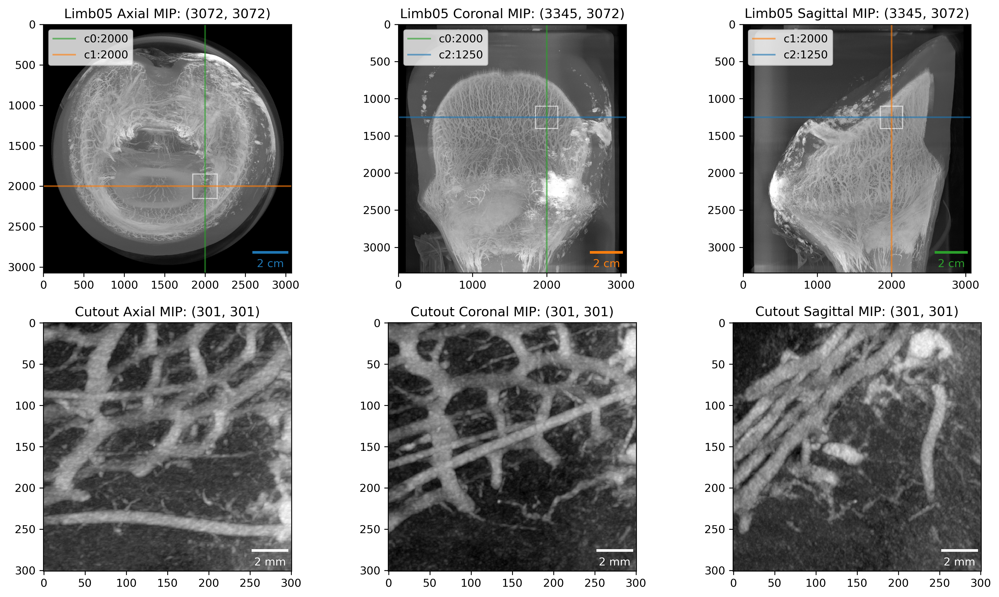

/home/habi/miniconda3/envs/laminitis/lib/python3.12/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


In [42]:
whichsample = 0
Cutout = cutout(whichsample,
                center=(2000,2000,1250),
                sidelength=301,
                verbose=True)

In [43]:
Cutout.shape

(301, 301, 301)

In [44]:
# Calculate histogram of cutout
import dask_image.ndmeasure
Histogram = dask_image.ndmeasure.histogram(Cutout, 0, 2**8, 2**8).compute()

In [45]:
Thresholds = skimage.filters.threshold_multiotsu(Cutout.compute(),
                                                 classes=5)
print(Thresholds)

[ 64  73  83 100]


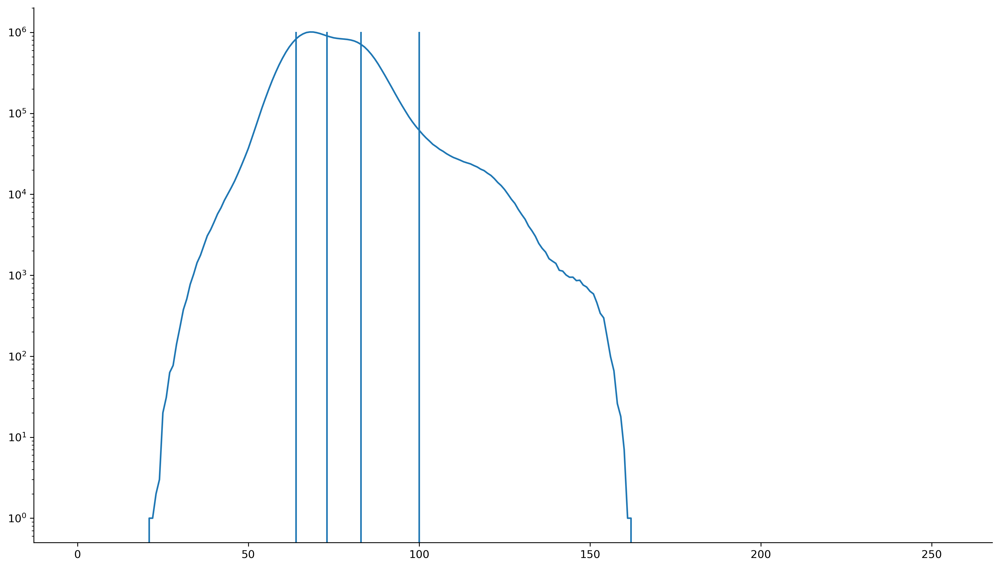

In [46]:
plt.semilogy(Histogram)
plt.vlines(Thresholds, 0, Histogram.max())
seaborn.despine()
plt.show()

In [47]:
import napari

In [48]:
viewer = napari.Viewer(ndisplay=3)

In [49]:
_ = viewer.add_image(Cutout)

In [50]:
import numpy
Thresholds = numpy.pad(Thresholds, (1,1), 'constant', constant_values=(0,2**8-1))

In [51]:
Thresholds

array([  0,  64,  73,  83, 100, 255])

In [52]:
len(Thresholds)  # don't do it for the last threshold, which is 255

6

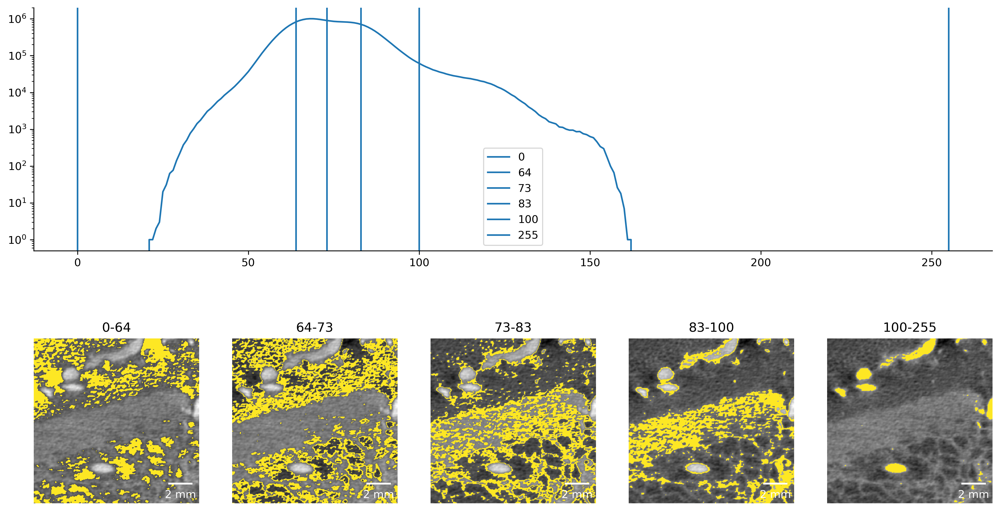

In [53]:
plt.subplot(211)
plt.semilogy(Histogram)
for c, t in enumerate(Thresholds):
    # Threshold
    plt.axvline(t, label=t)
plt.legend()
seaborn.despine()
for c, t in enumerate(Thresholds):
    if c +1 < len(Thresholds):  # don't do it for the last threshold, which is 255
        # Image
        plt.subplot(2, len(Thresholds) - 1, len(Thresholds) - 1 + c + 1)
        plt.imshow(Cutout[Cutout.shape[0]//2])
        plt.imshow(dask.array.ma.masked_outside(Cutout[Cutout.shape[0]//2], Thresholds[c], Thresholds[c+1]).astype('bool'), cmap='viridis_r')    
        plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um'))
        plt.title('%s-%s' % (Thresholds[c], Thresholds[c+1]))
        plt.axis('off')
plt.show()

In [54]:
Thresholds

array([  0,  64,  73,  83, 100, 255])

In [55]:
numpy.mean(Thresholds[-3:-1])

91.5

In [56]:
Vessels = (Cutout > numpy.mean(Thresholds[-3:-1]))

In [57]:
_ = viewer.add_image(Vessels, rendering='attenuated_mip')

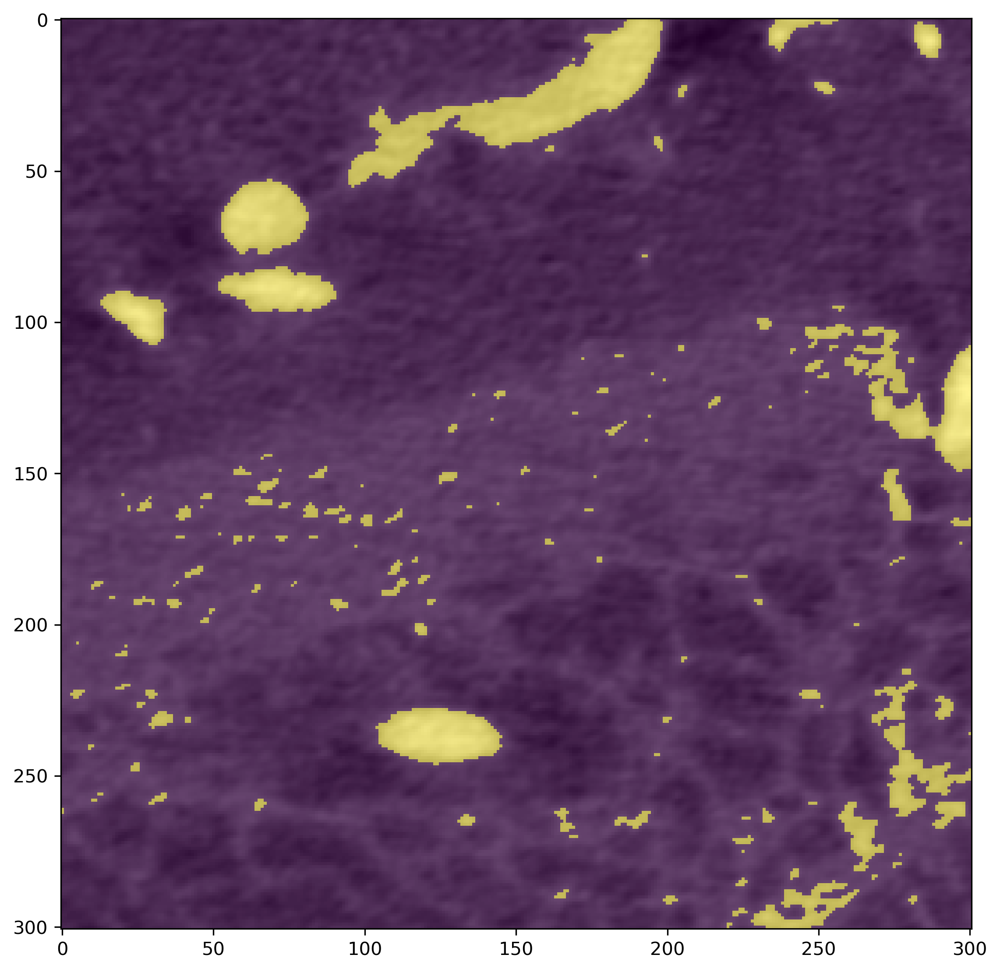

In [58]:
plt.imshow(Cutout[Cutout.shape[1]//2])
plt.imshow(Vessels[Cutout.shape[1]//2], cmap='viridis', alpha=0.5)
plt.show()

----

In [59]:
# Work on distance transformation and skeletonization

In [60]:
# https://skeleton-analysis.org/stable/getting_started/getting_started.html#extracting-a-skeleton-from-an-image

In [61]:
import skan

In [62]:
# skan.pre.threshold?

In [63]:
image0 = Cutout.compute()

In [64]:
spacing_nm = Data['Voxelsize'][0] * 1000

In [65]:
import numpy as np

In [66]:
from skan.pre import threshold

In [67]:
smooth_radius = 5 / spacing_nm  # float OK
threshold_radius = int(np.ceil(50 / spacing_nm))

In [68]:
smooth_radius

0.00011111111111111112

In [69]:
threshold_radius

1

In [70]:
binary0 = Vessels.copy().compute()

In [71]:
from skimage import morphology

skeleton0 = morphology.skeletonize(binary0)

In [72]:
from skan import draw

# fig, ax = plt.subplots()
# draw.overlay_skeleton_2d(image0[Cutout.shape[1]//2], skeleton0[Cutout.shape[1]//2], dilate=3, axes=ax);

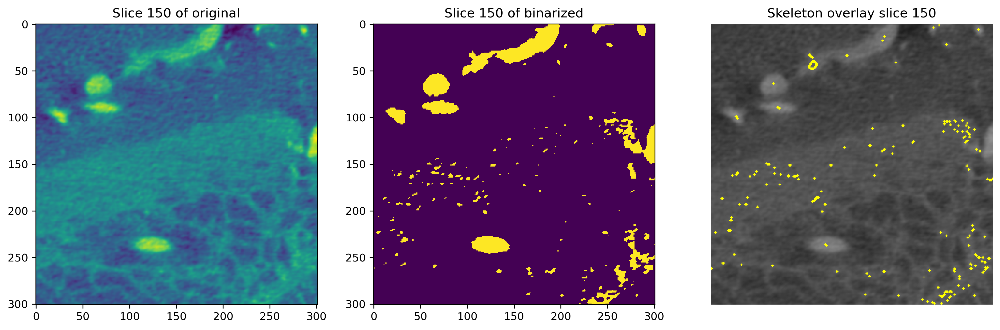

In [73]:
whichslice = Cutout.shape[1]//2
plt.subplot(131)
plt.imshow(image0[whichslice], cmap='viridis')
plt.title('Slice %s of original' % whichslice)
plt.subplot(132)
plt.imshow(binary0[whichslice], cmap='viridis')
plt.title('Slice %s of binarized' % whichslice)
plt.subplot(133)
draw.overlay_skeleton_2d(image0[whichslice],
                         skeleton0[whichslice],
                         color=(1,1,0),  # RGB
                         dilate=1,
                         axes=plt.gca());
plt.title('Skeleton overlay slice %s' % whichslice)
plt.show()

In [74]:
# skan.draw.pipeline_plot(image0[150], binary0[150], skeleton0[150], stats)

In [75]:
binary0.shape

(301, 301, 301)

In [76]:
numpy.unique(binary0)

array([False,  True])

In [77]:
# As such, the binarized vessels are unusable, as they contain holes/etc.
# Treat the binarized vessels a bit

In [78]:
discard_size = int(numpy.round(Cutout.shape[0]/6))

In [79]:
# Remove small, unconnected stuff in the binarized image
cleaned = skimage.morphology.remove_small_objects(binary0,
                                                  min_size=discard_size**3)

In [80]:
_ = viewer.add_image(cleaned, rendering='attenuated_mip')

In [81]:
filled = skimage.morphology.remove_small_holes(cleaned,
                                               area_threshold=discard_size**3)

In [82]:
_ = viewer.add_image(filled, rendering='attenuated_mip')

In [83]:
numpy.unique(filled)

array([False,  True])

In [84]:
# Recalculate skeleton on filled 
skeleton0 = morphology.skeletonize(filled)

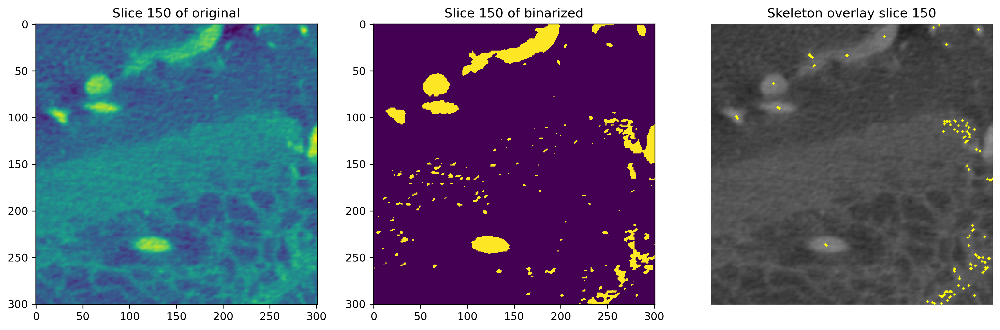

In [85]:
whichslice = Cutout.shape[1]//2
plt.subplot(131)
plt.imshow(image0[whichslice], cmap='viridis')
plt.title('Slice %s of original' % whichslice)
plt.subplot(132)
plt.imshow(binary0[whichslice], cmap='viridis')
plt.title('Slice %s of binarized' % whichslice)
plt.subplot(133)
draw.overlay_skeleton_2d(image0[whichslice],
                         skeleton0[whichslice],
                         color=(1,1,0),  # RGB
                         dilate=1,
                         axes=plt.gca());
plt.title('Skeleton overlay slice %s' % whichslice)
plt.show()

In [86]:
# Now that we have a 'working' skeleton, display it in 3D

In [87]:
# https://skeleton-analysis.org/stable/examples/visualizing_3d_skeletons.html

In [88]:
# import napari
# import numpy as np
# import skan
# from skimage.data import binary_blobs
# from skimage.morphology import skeletonize
# import scipy.ndimage as ndi

In [89]:
# blobs = binary_blobs(64, volume_fraction=0.3, n_dim=3)
# binary_skeleton = skeletonize(blobs)
binary_skeleton = skeleton0
skeleton = skan.Skeleton(binary_skeleton)

In [90]:
all_paths = [
        skeleton.path_coordinates(i)
        for i in range(skeleton.n_paths)
        ]

In [91]:
paths_table = skan.summarize(skeleton)

In [92]:
skan.__version__

'0.11.1'

In [93]:
paths_table['path_id'] = np.arange(skeleton.n_paths)

In [94]:
paths_table

,skeleton-id,node-id-src,node-id-dst,branch-distance,branch-type,mean-pixel-value,stdev-pixel-value,image-coord-src-0,image-coord-src-1,image-coord-src-2,...,image-coord-dst-1,image-coord-dst-2,coord-src-0,coord-src-1,coord-src-2,coord-dst-0,coord-dst-1,coord-dst-2,euclidean-distance,path_id
0,0,8,4316,119.992955,1,1.0,0.0,0,154,282,...,160,185,0,154,282,27,160,185,100.866248,0
1,0,20,1374,10.388905,1,1.0,0.0,0,178,144,...,179,145,0,178,144,8,179,145,8.124038,1
2,0,26,1541,15.634946,1,1.0,0.0,0,212,19,...,206,29,0,212,19,9,206,29,14.730920,2
3,1,34,1047,13.902895,1,1.0,0.0,0,234,300,...,226,292,0,234,300,6,226,292,12.806248,3
4,1,42,515,14.535169,1,1.0,0.0,0,253,212,...,250,222,0,253,212,3,250,222,10.862780,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9410,1,42985,42988,4.560478,2,1.0,0.0,299,287,239,...,288,237,299,287,239,299,288,237,2.236068,9410
9411,1,43021,43023,2.000000,1,1.0,0.0,300,226,255,...,226,257,300,226,255,300,226,257,2.000000,9411
9412,1,43023,43037,8.656854,2,1.0,0.0,300,226,257,...,230,264,300,226,257,300,230,264,8.062258,9412
9413,1,43095,43096,5.242641,2,1.0,0.0,300,262,266,...,263,262,300,262,266,300,263,262,4.123106,9413


In [95]:
paths_table['euclidean-distance'].max()

237.66573164846463

In [96]:
paths_table['random_path_id'] = np.random.default_rng().permutation(skeleton.n_paths)

In [97]:
# viewer = napari.Viewer(ndisplay=3)
skeleton_layer = viewer.add_shapes(
        all_paths,
        shape_type='path',
        properties=paths_table,
        edge_width=0.5,
        edge_color='random_path_id',
        edge_colormap='tab10',
)

In [98]:
skeleton_layer.edge_color = 'skeleton-id'
# for now, we need to set the face color as well
skeleton_layer.face_color = 'skeleton-id'

In [99]:
skeleton_layer.edge_color = 'branch-distance'
skeleton_layer.edge_colormap = 'viridis'
# for now, we need to set the face color as well
skeleton_layer.face_color = 'branch-distance'
skeleton_layer.face_colormap = 'viridis'

In [100]:
# Calculate and visualize distance transformation

In [101]:
import scipy

In [102]:
# Calculate EDT
EDT = scipy.ndimage.distance_transform_edt(filled)

In [106]:
# Scale skeleton with EDT
skeletonEDT = skeleton * EDT

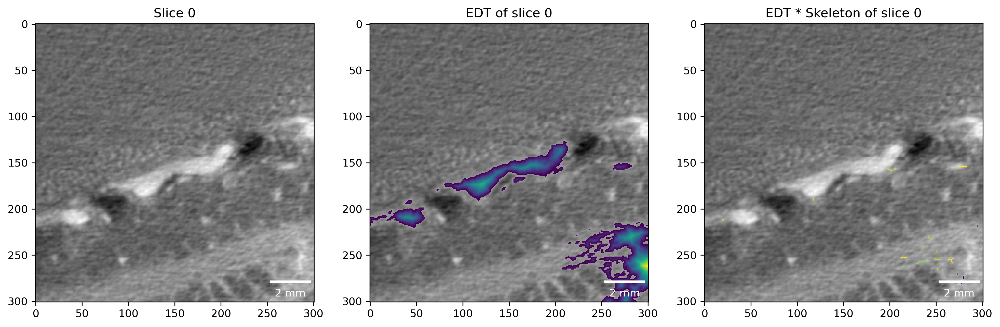

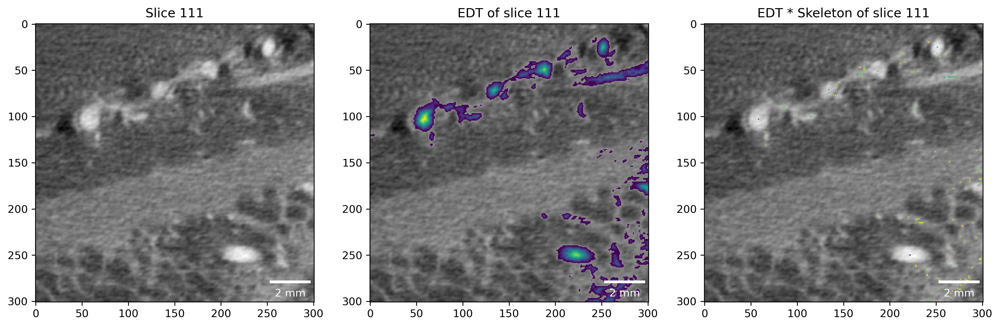

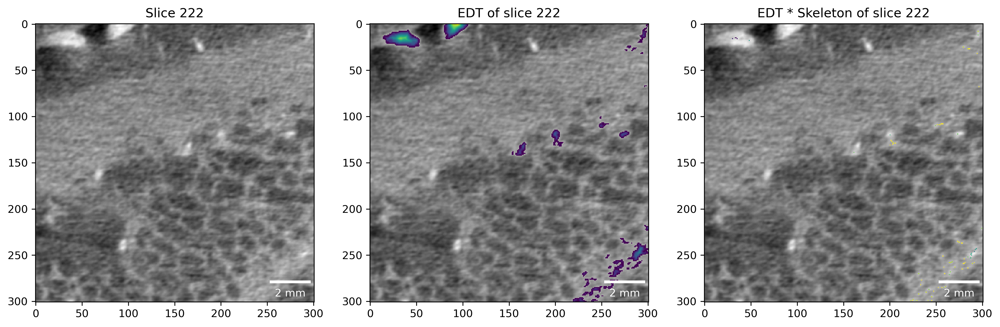

In [107]:
# Display what we did
for slice in range(Cutout.shape[0]):
    if not slice % 111:
        plt.subplot(131)
        plt.imshow(Cutout[slice])
        plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um'))
        plt.title('Slice %s' % slice)
        plt.subplot(132)
        plt.imshow(Cutout[slice])
        plt.imshow(dask.array.ma.masked_equal(EDT[slice], 0),
                   cmap='viridis')
        plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um'))
        plt.title('EDT of slice %s' % slice)
        plt.subplot(133)
        plt.imshow(Cutout[slice])
        plt.imshow(dask.array.ma.masked_equal(skeletonEDT[slice], 0),
                   cmap='viridis_r')
        plt.gca().add_artist(ScaleBar(Data['Voxelsize'][whichsample], 'um'))
        plt.title('EDT * Skeleton of slice %s' % slice)
        plt.show()

In [108]:
_ = viewer.add_image(skeletonEDT, colormap='viridis')

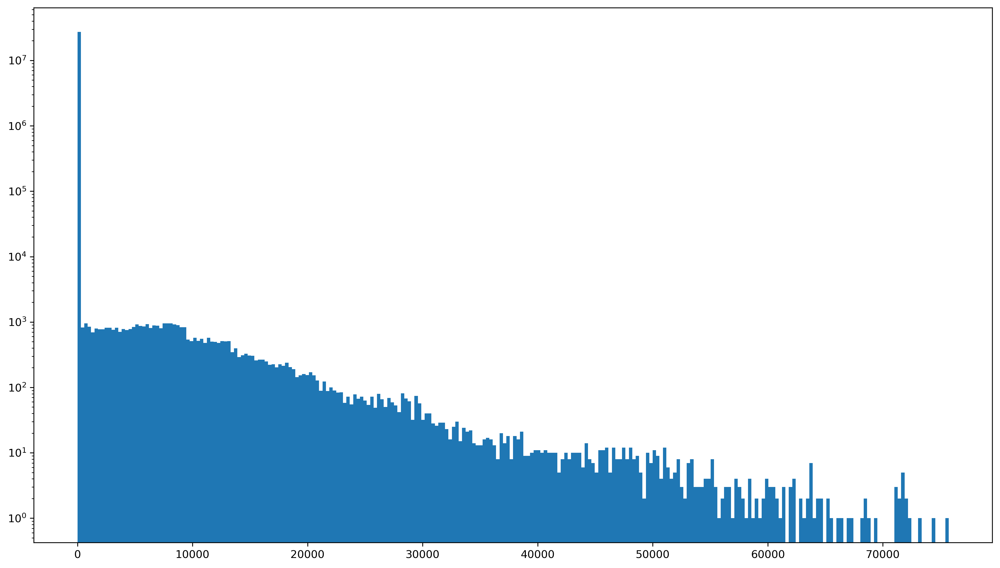

In [110]:
# Histogram of the EDT * Skeleton
plt.hist((skeletonEDT).ravel(), log=True, bins=256)
plt.show()

In [111]:
EDT.max()

19.44222209522358